# ML project [Predict this!] | [Diabetes 130-US hospitals]


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import seaborn as sns

import matplotlib.pyplot as plt
import os

from google.colab import drive
drive.mount('/content/drive', force_remount=True)
print( os.listdir('/content/drive') )

Mounted at /content/drive
['Shareddrives', 'MyDrive', '.file-revisions-by-id', '.shortcut-targets-by-id', '.Trash-0']


In [ ]:
ls drive/

MyDrive/  Shareddrives/


In [ ]:
!pip install pandas-profiling==2.7.1

     |████████████████████████████████| 252 kB 2.3 MB/s 
     |████████████████████████████████| 58 kB 5.4 MB/s 
     |████████████████████████████████| 675 kB 41.4 MB/s 
     |████████████████████████████████| 4.7 MB 40.4 MB/s 
     |████████████████████████████████| 812 kB 38.4 MB/s 
     |████████████████████████████████| 38.1 MB 1.3 MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=deb5ba90bce6a954894f60b25bc56e45e4376e99d7224c6d0439709ce29e868b
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295207 sha256=1b4ac5f0d336e0072858aade069a26eb95c727df328cc1b299ea43a327706d8b
  Stored in directory: /root/.cache/pip/wheels/4c/d5/59/5e3e297533ddb09407769762985d134135064c6831e29a914e
Successfully built htmlmin imagehash
  Attempting uninstall: scipy
    Found existing installation: scipy 1.4.1
    Uninstallin

In [ ]:
# Visualization
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

# Metrics
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.neighbors import LocalOutlierFactor
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score,f1_score,recall_score,mean_squared_error, r2_score, roc_auc_score, roc_curve, classification_report
from sklearn.metrics import classification_report
import sklearn.metrics as metrics
from sklearn.metrics import precision_recall_fscore_support

# Models
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/MLP/diabetic_data.csv", na_values="?")
data.head(n=10)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning:

Columns (10) have mixed types.Specify dtype option on import or set low_memory=False.



,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),NaN,6,25,1,1,NaN,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,NaN,NaN,1,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),NaN,1,1,7,3,NaN,NaN,59,0,18,0,0,0,276,250.01,255,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),NaN,1,1,7,2,NaN,NaN,11,5,13,2,0,1,648,250,V27,6,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),NaN,1,1,7,2,NaN,NaN,44,1,16,0,0,0,8,250.43,403,7,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),NaN,1,1,7,1,NaN,NaN,51,0,8,0,0,0,197,157,250,5,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
5,35754,82637451,Caucasian,Male,[50-60),NaN,2,1,2,3,NaN,NaN,31,6,16,0,0,0,414,411,250,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,>30
6,55842,84259809,Caucasian,Male,[60-70),NaN,3,1,2,4,NaN,NaN,70,1,21,0,0,0,414,411,V45,7,None,None,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
7,63768,114882984,Caucasian,Male,[70-80),NaN,1,1,7,5,NaN,NaN,73,0,12,0,0,0,428,492,250,8,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
8,12522,48330783,Caucasian,Female,[80-90),NaN,2,1,4,13,NaN,NaN,68,2,28,0,0,0,398,427,38,8,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
9,15738,63555939,Caucasian,Female,[90-100),NaN,3,3,4,12,NaN,InternalMedicine,33,3,18,0,0,0,434,198,486,8,None,None,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      99493 non-null   object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    3197 non-null    object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                61510 non-null   object
 11  medical_specialty         51817 non-null   object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

In [ ]:
data.isna().sum()

encounter_id                    0
patient_nbr                     0
race                         2273
gender                          0
age                             0
weight                      98569
admission_type_id               0
discharge_disposition_id        0
admission_source_id             0
time_in_hospital                0
payer_code                  40256
medical_specialty           49949
num_lab_procedures              0
num_procedures                  0
num_medications                 0
number_outpatient               0
number_emergency                0
number_inpatient                0
diag_1                         21
diag_2                        358
diag_3                       1423
number_diagnoses                0
max_glu_serum                   0
A1Cresult                       0
metformin                       0
repaglinide                     0
nateglinide                     0
chlorpropamide                  0
glimepiride                     0
acetohexamide 

In [ ]:
data.describe()

,encounter_id,patient_nbr,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
count,1.017660e+05,1.017660e+05,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,1.652016e+08,5.433040e+07,2.024006,3.715642,5.754437,4.395987,43.095641,1.339730,16.021844,0.369357,0.197836,0.635566,7.422607
std,1.026403e+08,3.869636e+07,1.445403,5.280166,4.064081,2.985108,19.674362,1.705807,8.127566,1.267265,0.930472,1.262863,1.933600
min,1.252200e+04,1.350000e+02,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,8.496119e+07,2.341322e+07,1.000000,1.000000,1.000000,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,0.000000,6.000000
50%,1.523890e+08,4.550514e+07,1.000000,1.000000,7.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,8.000000
75%,2.302709e+08,8.754595e+07,3.000000,4.000000,7.000000,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,9.000000
max,4.438672e+08,1.895026e+08,8.000000,28.000000,25.000000,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000


In [ ]:
#I used pandas_profiling for report
import pandas_profiling as pp

profile = pp.ProfileReport(data) #to display the report
profile

Process ForkPoolWorker-4:
Process ForkPoolWorker-3:
Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/usr/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/usr/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.7/multiprocessing/pool.py", line 121, in worker
    result = (True, func(*args, **kwds))
  File "/usr/lib/python3.7/multiprocessing/pool.py", line 44, in mapstar
    return list(map(*args))
  File "/usr/lib/python3.7/multiprocessing/pool.py", line 121, in worker
    result = (True, func(*args, **kwds))
  File "/usr/lib/python3.7/multiprocessing/pool.py", line 44, in mapstar
    return list(map(*args))
  File "/usr/local/lib

KeyboardInterrupt: ignored

  File "/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/__init__.py", line 61, in plot
    plot_obj.generate()
  File "/usr/local/lib/python3.7/dist-packages/pandas_profiling/describe.py", line 55, in describe_numeric_1d
    stats['mini_histogram'] = mini_histogram(series, **kwargs)
  File "/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py", line 268, in generate
    self._args_adjust()
  File "/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/hist.py", line 24, in _args_adjust
    values = self.data._convert(datetime=True)._get_numeric_data()
  File "/usr/local/lib/python3.7/dist-packages/pandas_profiling/plot.py", line 97, in mini_histogram
    plot = _plot_histogram(series, figsize=(2, 0.75), **kwargs)
  File "/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py", line 5262, in _get_numeric_data
    return self._constructor(self._mgr.get_numeric_data()).__finalize__(self)
  File "/usr/local/lib/python3.7/dist-pack

In [ ]:
# profile.to_file(output_file="output.html")

# Data Preprocessing 

In [ ]:
# examide has constant value "No"	Constant
# citoglipton has constant value "No"	Constant
# medical_specialty has a high cardinality: 72 distinct values	High cardinality
# diag_1 has a high cardinality: 716 distinct values	High cardinality
# diag_2 has a high cardinality: 748 distinct values	High cardinality
# diag_3 has a high cardinality: 789 distinct values	High cardinality
# race has 2273 (2.2%) missing values	Missing
# weight has 98569 (96.9%) missing values	Missing
# payer_code has 40256 (39.6%) missing values	Missing
# medical_specialty has 49949 (49.1%) missing values	Missing
# diag_3 has 1423 (1.4%) missing values	Missing
# number_emergency is highly skewed (γ1 = 22.85558215)	Skewed
# encounter_id has unique values	Unique
# num_procedures has 46652 (45.8%) zeros	Zeros
# number_outpatient has 85027 (83.6%) zeros	Zeros
# number_emergency has 90383 (88.8%) zeros	Zeros
# number_inpatient has 67630 (66.5%) zeros	Zeros

No: of features:  50
No: of training datapoints:  101766
No: of test datapoints:  101766


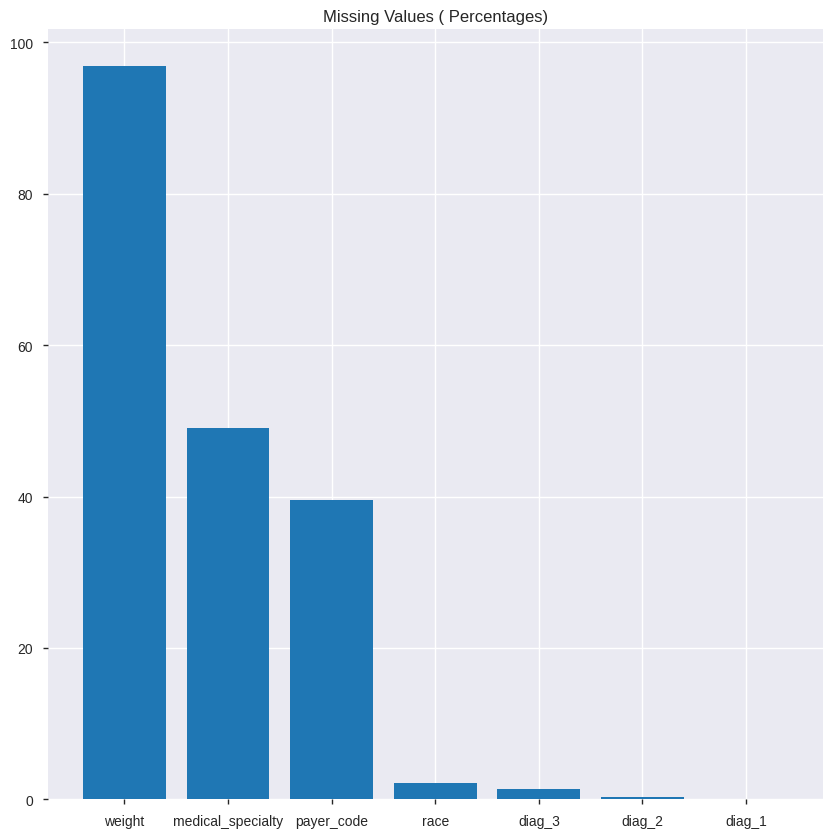

In [ ]:
print("No: of features: ", len(data.columns))
print("No: of training datapoints: ", len(data.index))
print("No: of test datapoints: ", len(data.index))

def plot_missing(df, title):
  samples = len(df.index)  
  cols_with_missing_data = []
  for col_name in df:
    cols_with_missing_data.append((col_name, len(df[df[col_name].isna() ])/samples ))
  cols_with_missing_data.sort(key=lambda x: x[1], reverse=True)
  fig, axs = plt.subplots(1, 1, figsize=(10, 10))
  filtered_list = list(filter(lambda x: x[1]>0.00005, cols_with_missing_data))
  plt.bar([item[0] for item in filtered_list], [item[1]*100 for item in filtered_list])
  plt.title(f"Missing Values ({title})")
plot_missing(data, " Percentages")

## Removing redundant features

In [ ]:
# examide has constant value "No"	Constant
# citoglipton has constant value "No"	Constant
# weight has 98569 (96.9%) missing values	Missing
# payer_code has 40256 (39.6%) missing values	Missing
# medical_specialty has 49949 (49.1%) missing values	Missing
# encounter_id has unique values	Unique


In [ ]:
def remove_redundant_features(df, cols):
  data.drop(columns=cols, inplace=True)

for column in data.columns:
  print(column, len(data[column].value_counts()))

remove_redundant_features(data, ["weight", "medical_specialty", "payer_code", "encounter_id", "citoglipton", "examide"])

data = data.drop_duplicates(subset= ['patient_nbr'], keep = 'first')
data.head()
print(len(data.columns))

encounter_id 101766
patient_nbr 71518
race 5
gender 3
age 10
weight 9
admission_type_id 8
discharge_disposition_id 26
admission_source_id 17
time_in_hospital 14
payer_code 17
medical_specialty 72
num_lab_procedures 118
num_procedures 7
num_medications 75
number_outpatient 39
number_emergency 33
number_inpatient 21
diag_1 716
diag_2 748
diag_3 789
number_diagnoses 16
max_glu_serum 4
A1Cresult 4
metformin 4
repaglinide 4
nateglinide 4
chlorpropamide 4
glimepiride 4
acetohexamide 2
glipizide 4
glyburide 4
tolbutamide 2
pioglitazone 4
rosiglitazone 4
acarbose 4
miglitol 4
troglitazone 2
tolazamide 3
examide 1
citoglipton 1
insulin 4
glyburide-metformin 4
glipizide-metformin 2
glimepiride-pioglitazone 2
metformin-rosiglitazone 2
metformin-pioglitazone 2
change 2
diabetesMed 2
readmitted 3
44


 # remove patient_nbr

In [ ]:
print(data.shape)
data.drop(['patient_nbr'], axis=1, inplace = True)
data.columns

(71518, 44)


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Index(['race', 'gender', 'age', 'admission_type_id',
       'discharge_disposition_id', 'admission_source_id', 'time_in_hospital',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient', 'diag_1',
       'diag_2', 'diag_3', 'number_diagnoses', 'max_glu_serum', 'A1Cresult',
       'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'insulin', 'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted'],
      dtype='object')

##### #Race

In [ ]:
data.race.fillna("NA", inplace=True)
data.race = data.race.astype('category')
data.race.value_counts()

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4536: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:5170: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Caucasian          53491
AfricanAmerican    12887
NA                  1948
Hispanic            1517
Other               1178
Asian                497
Name: race, dtype: int64

In [ ]:
data.shape

(71518, 43)

##### #Gender

In [ ]:
data.drop(data[data.gender == 'Unknown/Invalid'].index, inplace = True)
data.gender = data.gender.astype("category")
data.gender.value_counts()

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:5170: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Female    38025
Male      33490
Name: gender, dtype: int64

## Pruning features

##### #Age

In [ ]:
print("#Before")
print(data['age'].value_counts())


age_rule = {"age": {"[70-80)": 75,
                     "[60-70)": 65,
                     "[50-60)": 55,
                     "[80-90)": 85,
                     "[40-50)": 45,
                     "[30-40)": 35,
                     "[90-100)":95,
                     "[20-30)": 25,
                     "[10-20)": 15,
                     "[0-10)" : 5,
                     }
             }
print("-------------------------")
print("#After")
data.replace(age_rule,inplace=True)
print(data['age'].value_counts())

#Before
[70-80)     18208
[60-70)     15959
[50-60)     12466
[80-90)     11589
[40-50)      6878
[30-40)      2699
[90-100)     1900
[20-30)      1127
[10-20)       535
[0-10)        154
Name: age, dtype: int64
-------------------------
#After
75    18208
65    15959
55    12466
85    11589
45     6878
35     2699
95     1900
25     1127
15      535
5       154
Name: age, dtype: int64


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1743: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Readmitted 

In [ ]:
data.readmitted.value_counts()

readmitted_rule = {"readmitted":{
    ">30": 0,
    "NO": 0,
    "<30": 1
}}

data.replace(readmitted_rule, inplace=True)
print("-------------------------")
data.readmitted.value_counts()

-------------------------


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1743: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



0    65222
1     6293
Name: readmitted, dtype: int64

# Adding transformations here to check- will modify later

In [ ]:
data_checkpoint1 = data.copy()


In [ ]:
# 1.Circulatory → 390–459, 785 → Diseases of the circulatory system
# 2.Respiratory → 460–519, 786 → Diseases of the respiratory system
# 3.Digestive → 520–579, 787 → Diseases of the digestive system
# 4.Diabetes → 250.xx → Diabetes mellitus
# 5.Injury → 800–999 → Injury and poisoning
# 6.Musculoskeletal → 710–739 → Diseases of the musculoskeletal system and connective tissue
# 7.Genitourinary → 580–629, 788 → Diseases of the genitourinary system
# 8.Neoplasms → 140–239 → Neoplasms
# 9.Pregnecy → 630–679 → Complications of pregnancy, childbirth, and the puerperium
# 10.Other

In [ ]:
# diag_1 = Counter(list(data['diag_1'])).most_common(1)[0][0]
# diag_2 = Counter(list(data['diag_2'])).most_common(1)[0][0]
# diag_3 = Counter(list(data['diag_3'])).most_common(1)[0][0]

# data['diag_1'] = data['diag_1'].apply(lambda x : diag_1 if x == '?' else x)
# data['diag_2'] = data['diag_1'].apply(lambda x : diag_2 if x == '?' else x)
# data['diag_3'] = data['diag_3'].apply(lambda x : diag_3 if x == '?' else x)

In [ ]:
data["diag_1"].fillna(data["diag_1"].mode()[0], inplace=True)
data["diag_2"].fillna(data["diag_2"].mode()[0], inplace=True)
data["diag_3"].fillna(data["diag_3"].mode()[0], inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4536: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
 
print(len(np.unique(data['diag_1'])))  
print(len(np.unique(data['diag_2'])))  
print(len(np.unique(data['diag_3'])))  

data['diag_1'] = data['diag_1'].apply(lambda x : 'other' if (str(x).find('V') != -1 or str(x).find('E') != -1)  
                                        else ('circulatory' if int(float(x)) in range(390, 460) or int(float(x)) == 785
                                        else     ('respiratory' if int(float(x)) in range(460, 520) or int(float(x)) == 786
                                        else     ('digestive'   if int(float(x)) in range(520, 580) or int(float(x)) == 787
                                        else     ('diabetes'    if int(float(x)) == 250
                                        else     ('injury'      if int(float(x)) in range(800, 1000)
                                        else ('musculoskeletal' if int(float(x)) in range(710, 740)
                                        else ('genitourinary'   if int(float(x)) in range(580, 630) or int(float(x)) == 788
                                        else ('neoplasms'       if int(float(x)) in range(140, 240)
                                        else ('pregnecy'        if int(float(x)) in range(630, 680)
                                        else 'other'))))))))))

data['diag_2'] = data['diag_2'].apply(lambda x : 'other' if (str(x).find('V') != -1 or str(x).find('E') != -1)  
                                        else ('circulatory' if int(float(x)) in range(390, 460) or int(float(x)) == 785
                                        else     ('respiratory' if int(float(x)) in range(460, 520) or int(float(x)) == 786
                                        else     ('digestive'   if int(float(x)) in range(520, 580) or int(float(x)) == 787
                                        else     ('diabetes'    if int(float(x)) == 250
                                        else     ('injury'      if int(float(x)) in range(800, 1000)
                                        else ('musculoskeletal' if int(float(x)) in range(710, 740)
                                        else ('genitourinary'   if int(float(x)) in range(580, 630) or int(float(x)) == 788
                                        else ('neoplasms'       if int(float(x)) in range(140, 240)
                                        else ('pregnecy'        if int(float(x)) in range(630, 680)
                                        else 'other'))))))))))

data['diag_3'] = data['diag_3'].apply(lambda x : 'other' if (str(x).find('V') != -1 or str(x).find('E') != -1)  
                                        else ('circulatory' if int(float(x)) in range(390, 460) or int(float(x)) == 785
                                        else     ('respiratory' if int(float(x)) in range(460, 520) or int(float(x)) == 786
                                        else     ('digestive'   if int(float(x)) in range(520, 580) or int(float(x)) == 787
                                        else     ('diabetes'    if int(float(x)) == 250
                                        else     ('injury'      if int(float(x)) in range(800, 1000)
                                        else ('musculoskeletal' if int(float(x)) in range(710, 740)
                                        else ('genitourinary'   if int(float(x)) in range(580, 630) or int(float(x)) == 788
                                        else ('neoplasms'       if int(float(x)) in range(140, 240)
                                        else ('pregnecy'        if int(float(x)) in range(630, 680)
                                        else 'other'))))))))))  

print(np.unique(data['diag_1']), '\n')           
print(np.unique(data['diag_2']), '\n')
print(np.unique(data['diag_3']), '\n') 

696
725
758


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



['circulatory' 'diabetes' 'digestive' 'genitourinary' 'injury'
 'musculoskeletal' 'neoplasms' 'other' 'pregnecy' 'respiratory'] 

['circulatory' 'diabetes' 'digestive' 'genitourinary' 'injury'
 'musculoskeletal' 'neoplasms' 'other' 'pregnecy' 'respiratory'] 

['circulatory' 'diabetes' 'digestive' 'genitourinary' 'injury'
 'musculoskeletal' 'neoplasms' 'other' 'pregnecy' 'respiratory'] 



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
### lets analyse numeric features 
from tqdm import tqdm

data['health_index'] = data.apply(lambda x:  1 / (x['number_emergency'] + x['number_inpatient'] + x['number_outpatient'])
                                  if x['number_emergency'] != 0 or x['number_inpatient'] != 0 or x['number_outpatient'] != 0
                                  else 1, axis = 1)



total = data['time_in_hospital'].sum() + data['num_procedures'].sum() + \
                              data['num_medications'].sum() + data['num_lab_procedures'].sum() + \
                              data['number_diagnoses'].sum()

data['severity_of_disease'] = (data['time_in_hospital'] + data['num_procedures'] + \
                              data['num_medications'] + data['num_lab_procedures'] + \
                              data['number_diagnoses']) / total

drugList = ['metformin','repaglinide','nateglinide','chlorpropamide','glimepiride','acetohexamide',\
            'glipizide','glyburide','tolbutamide','pioglitazone','rosiglitazone','acarbose','miglitol',\
            'troglitazone','tolazamide','insulin','glyburide-metformin','glipizide-metformin',\
            'glimepiride-pioglitazone','metformin-rosiglitazone','metformin-pioglitazone']


# number_of_changes = []
# for i in tqdm(range(len(data))) :
#     changeCount = 0
#     for col in drugList : 
#         if data.iloc[i][col] in ['Down', 'Up'] :
#             changeCount += 1
#     number_of_changes.append(changeCount)

# data['number_of_changes'] = number_of_changes

number_of_changes = []
def count_changes(encounter):
  changeCount = 0
  for col in drugList :
    if encounter[col] in ['Down', 'Up'] :
            changeCount += 1
  return changeCount

data['number_of_changes'] = data.apply(lambda x: count_changes(x), axis=1) 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/

In [ ]:
data.head(5)

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,health_index,severity_of_disease,number_of_changes
0,Caucasian,Female,5,6,25,1,1,41,0,1,0,0,0,diabetes,diabetes,diabetes,1,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,0,1.000000,0.000009,0
1,Caucasian,Female,15,1,1,7,3,59,0,18,0,0,0,other,diabetes,other,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,0,1.000000,0.000017,1
2,AfricanAmerican,Female,25,1,1,7,2,11,5,13,2,0,1,pregnecy,diabetes,other,6,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,0,0.333333,0.000007,0
3,Caucasian,Male,35,1,1,7,2,44,1,16,0,0,0,other,diabetes,circulatory,7,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,0,1.000000,0.000014,1
4,Caucasian,Male,45,1,1,7,1,51,0,8,0,0,0,neoplasms,neoplasms,diabetes,5,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,0,1.000000,0.000013,0


In [ ]:
# A1Cresult
# The normal is below 5.7%, prediabetes is 5.7% to
# 6.4% and diabetes is 6.5% or above. I coded values above 7% as “1” as in diabetic,
# less than 7% as “0” as in not-diabetic, and if the test was not administered, I coded
# it as “-99”

# max_glu_serum
# This test measures the blood sugar level in mg/dL. 200 mg/dL or above is
# considered diabetic [9]. I coded values above 200 mg/dL as “1” as in diabetic, less
# than 200 mg/dL as “0” as in not-diabetic, and if the test was not administered, I
# coded it as “-99”

# "No" = -99 (If the drug was not prescribed)
# "Steady" = 0 (If there was no change in the drug prescription through the time)
# "Up" = 1 (If the drug prescription increased)
# "Down" = -1 (If the drug prescription decreased)



In [ ]:
# adding transformations here will modify later

data['discharge_disposition_id'] = data['discharge_disposition_id'].apply(lambda x : 1 if int(x) in [6, 8, 9, 13] 
                                                                           else ( 2 if int(x) in [3, 4, 5, 14, 22, 23, 24]
                                                                           else ( 10 if int(x) in [12, 15, 16, 17]
                                                                           else ( 11 if int(x) in [19, 20, 21]
                                                                           else ( 18 if int(x) in [25, 26] 
                                                                           else int(x) )))))

data = data[~data.discharge_disposition_id.isin([11,13,14,19,20,21])]

data['admission_type_id'] = data['admission_type_id'].apply(lambda x : 1 if int(x) in [2, 7]
                                                            else ( 5 if int(x) in [6, 8]
                                                            else int(x) ))

data['admission_source_id'] = data['admission_source_id'].apply(lambda x : 1 if int(x) in [2, 3]
                                                            else ( 4 if int(x) in [5, 6, 10, 22, 25]
                                                            else ( 9 if int(x) in [15, 17, 20, 21]
                                                            else ( 11 if int(x) in [13, 14]
                                                            else int(x) ))))

for col in ["metformin", "repaglinide", "nateglinide", "chlorpropamide", "glimepiride", "acetohexamide", "glipizide", "glyburide", "tolbutamide", "pioglitazone", "rosiglitazone", "acarbose", "miglitol", "troglitazone", "tolazamide", "insulin", "glyburide-metformin", "glipizide-metformin", "glimepiride-pioglitazone", "metformin-rosiglitazone", "metformin-pioglitazone"]:
    data[col] = data[col].apply(lambda x : 10 if x == 'Up' 
                                              else ( -10 if x == 'Down'                                                          
                                              else ( 0 if x == 'Steady'
                                              else  -20)))


data['change'] = data['change'].apply(lambda x : 1 if x == 'Ch'
                                                 else -1)


data['diabetesMed'] = data['diabetesMed'].apply(lambda x : -1 if x == 'No'
                                                else 1)


data['max_glu_serum'] = data['max_glu_serum'].apply(lambda x : 200 if x == '>200' 
                                                            else ( 300 if x == '>300'                                                          
                                                            else ( 100 if x == 'Norm'
                                                            else  0)))

data['A1Cresult'] = data['A1Cresult'].apply(lambda x : 7 if x == '>7' 
                                                         else (8 if  x == '>8'                                                        
                                                         else ( 5 if x == 'Norm'
                                                         else  0)))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
data_checkpoint = data.copy()     
data_checkpoint.head(5)

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,health_index,severity_of_disease,number_of_changes
0,Caucasian,Female,5,5,18,1,1,41,0,1,0,0,0,diabetes,diabetes,diabetes,1,0,0,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-1,-1,0,1.000000,0.000009,0
1,Caucasian,Female,15,1,1,7,3,59,0,18,0,0,0,other,diabetes,other,9,0,0,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,10,-20,-20,-20,-20,-20,1,1,0,1.000000,0.000017,1
2,AfricanAmerican,Female,25,1,1,7,2,11,5,13,2,0,1,pregnecy,diabetes,other,6,0,0,-20,-20,-20,-20,-20,-20,0,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-1,1,0,0.333333,0.000007,0
3,Caucasian,Male,35,1,1,7,2,44,1,16,0,0,0,other,diabetes,circulatory,7,0,0,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,10,-20,-20,-20,-20,-20,1,1,0,1.000000,0.000014,1
4,Caucasian,Male,45,1,1,7,1,51,0,8,0,0,0,neoplasms,neoplasms,diabetes,5,0,0,-20,-20,-20,-20,-20,-20,0,-20,-20,-20,-20,-20,-20,-20,-20,0,-20,-20,-20,-20,-20,1,1,0,1.000000,0.000013,0


In [ ]:
data_checkpoint.to_csv('./drive/MyDrive/MLP/preprocessed_data.csv')
%ls

drive/  sample_data/


In [ ]:
pd.read_csv('./drive/MyDrive/MLP/preprocessed_data.csv').head(5)

,Unnamed: 0,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,health_index,severity_of_disease
0,0,Caucasian,Female,5,5,18,1,1,41,0,1,0,0,0,diabetes,diabetes,diabetes,1,0,0,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-1,-1,0,1.000000,0.000009
1,1,Caucasian,Female,15,1,1,7,3,59,0,18,0,0,0,other,diabetes,other,9,0,0,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,10,-20,-20,-20,-20,-20,1,1,0,1.000000,0.000017
2,2,AfricanAmerican,Female,25,1,1,7,2,11,5,13,2,0,1,pregnecy,diabetes,other,6,0,0,-20,-20,-20,-20,-20,-20,0,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-1,1,0,0.333333,0.000007
3,3,Caucasian,Male,35,1,1,7,2,44,1,16,0,0,0,other,diabetes,circulatory,7,0,0,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,10,-20,-20,-20,-20,-20,1,1,0,1.000000,0.000014
4,4,Caucasian,Male,45,1,1,7,1,51,0,8,0,0,0,neoplasms,neoplasms,diabetes,5,0,0,-20,-20,-20,-20,-20,-20,0,-20,-20,-20,-20,-20,-20,-20,-20,0,-20,-20,-20,-20,-20,1,1,0,1.000000,0.000013


In [ ]:
import pandas_profiling as pp

profile = pp.ProfileReport(data) #to display the report
profile


Summarize dataset:   0%|          | 0/58 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file(output_file="preprocessed_output.html")


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# STOP1

##### #Admission type

In [ ]:
# print("#Before")
# print(data['admission_type_id'].value_counts())

# admission_type_rule = {"admission_type_id": { 1: 'Emergency',
#                        2: 'Urgent',
#                        3: 'Elective',
#                        4: 'Newborn',
#                        5: 'NA',
#                        6: 'NA',
#                        7: 'Trauma',
#                        8:'NA'
#                        }
#              }
# print("-------------------------")
# print("#After")
# data.replace(admission_type_rule,inplace=True)
# data["admission_type_id"] = data["admission_type_id"].astype('category')
# print(data['admission_type_id'].value_counts())
# print(data["admission_type_id"].dtype)

##### #Discharge Disposition, #Admission source

//TODO: Since the objective is to predict readmissions, those patients who died during this hospital admission were excluded. Encounters with “Discharge disposition” values of 11, 13, 14, 19, 20, or 21 are related to death or hospice which mean these patients cannot be readmitted.
###### No Changes

In [ ]:
# print("----------------------------")
# print(data.discharge_disposition_id.value_counts())
# print("----------------------------")
# print(data.admission_source_id.value_counts())

##### #Payer Code

// TODO 
Lot of missing values in this attribute. Will have to recheck whether misisng values are useful  

In [ ]:
# data = data[~data["payer_code"].isna()]
# data.payer_code = data.payer_code.astype('category')
# data.payer_code.value_counts()

##### #Medical specialty

In [ ]:
# data.medical_specialty.fillna("NA",inplace=True)
# data.medical_specialty = data.medical_specialty.astype('category')
# data.medical_specialty.value_counts()

In [ ]:
# print(data.num_lab_procedures.value_counts())
# print(data.num_lab_procedures.dtype)
# print("----------------------------------")
# print(data.num_procedures.value_counts())
# print(data.num_procedures.dtype)
# print("----------------------------------")
# print(data.num_medications.value_counts())
# print(data.num_medications.dtype)


# print("----------------------------------")
# print(data.number_outpatient.value_counts())
# print(data.number_outpatient.dtype)
# print("----------------------------------")
# print(data.number_emergency.value_counts())
# print(data.number_emergency.dtype)
# print("----------------------------------")
# print(data.number_inpatient.value_counts())
# print(data.number_inpatient.dtype)

// TODO # df2 = df.drop_duplicates(subset= ['patient_nbr'], keep = 'first')

##### #Diag_1, Diag_2, Diag_3

In [ ]:

# def convert_diag_to_int(x):
#   try:
#     return int(float(x))
#   except:
#     # print(x)
#     try:
#       return int(float(x[1]))
#     except:
#       return x
# data["diag_1"] = data["diag_1"].apply(lambda x: convert_diag_to_int(x))
# data["diag_1"].fillna(data["diag_1"].mean(), inplace=True)
# data.diag_1 = data.diag_1.astype(np.int64)
# data["diag_2"] = data["diag_2"].apply(lambda x: convert_diag_to_int(x))
# data["diag_2"].fillna(data["diag_2"].mean(), inplace=True)
# data.diag_2 = data.diag_2.astype(np.int64)

# data["diag_3"] = data["diag_3"].apply(lambda x: convert_diag_to_int(x))
# data["diag_3"].fillna(data["diag_3"].mean(), inplace=True)
# data.diag_3 = data.diag_3.astype(np.int64)

In [ ]:
# print(data.number_diagnoses.value_counts())
# print(data.number_diagnoses.dtype)

##### #Glucose Serum

In [ ]:
# print("#Before")
# print(data["max_glu_serum"].value_counts())

# max_glu_serum_rule = {"max_glu_serum": {"None": 0,
#                      "Norm": 1,
#                      ">200": 2,
#                      ">300": 3
#                      }
#              }

# data.replace(max_glu_serum_rule, inplace=True)
# data.max_glu_serum = data.max_glu_serum.astype(np.int64)

# print("-------------------------")
# print("#After")
# print(data["max_glu_serum"].value_counts())

##### A1Cresult

In [ ]:
# print("#Before")
# print(data["A1Cresult"].value_counts())

# A1Cresult_rule = {"A1Cresult": {"None": 0,
#                      "Non": 0,
#                      "Norm":1,
#                      ">7": 2,
#                      ">8": 3
#                      }
#              }

# data.replace(A1Cresult_rule, inplace=True)
# data.A1Cresult = data.A1Cresult.astype(np.int64)

# print("-------------------------")
# print("#After")
# print(data["A1Cresult"].value_counts())

##### #Change of Medication

In [ ]:
# print("#Before")
# print(data["change"].value_counts())

# change_rule = {"change": {"No": 0,
#                      "Ch": 1
#                      }
#              }

# data.replace(change_rule, inplace=True)
# data.change = data.change.astype(np.bool)
# print(data.change.dtype)
# print("-------------------------")
# print("#After")
# print(data["change"].value_counts())

##### #Diabetic Medication

In [ ]:
# print("#Before")
# print(data["diabetesMed"].value_counts())

# diabetes_med_rule = {"diabetesMed": {"No": 0,
#                      "Yes": 1
#                      }
#              }

# data.replace(diabetes_med_rule, inplace=True)
# data.diabetesMed = data.diabetesMed.astype(np.bool)
# print(data.diabetesMed.dtype)
# print("-------------------------")
# print("#After")
# print(data["change"].value_counts())

##### #Readmitted

In [ ]:
# data.readmitted.value_counts()

# readmitted_rule = {"readmitted":{
#     ">30": 0,
#     "NO": 0,
#     "<30": 1
# }}

# data.replace(readmitted_rule, inplace=True)
# print("-------------------------")
# data.readmitted.value_counts()

In [ ]:
# print("-------------------------")
# data = data[~data.readmitted.isna()] # removing one datapoint that does not have the label
# data.readmitted = data.readmitted.astype(np.int64)
# data.readmitted.value_counts()

In [ ]:
# data.info()

### Filtering medicine dosages and changing data types

##### All the object datatypes remaining are medicine dosages

In [ ]:
# dt = {}
# medicine_values = {
#     "Down": 0,
#     "No": 1,
#     "Steady": 2,
#     "Up": 3 
# }

# for col in data.columns:
#   if(data[col].dtype == "object"):
#     dt[col] = medicine_values
#     # print("-------------")
#     # print(col)
# data.replace(dt, inplace=True)   

In [ ]:
# def getCategories(df):
#   cat_columns = []
#   for col in data.columns:
#     if(data[col].dtype.name == "category"):
#       cat_columns.append(col)
#   return cat_columns
# data.info()

# START

In [ ]:
# data = data_checkpoint.copy()

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 70431 entries, 0 to 101765
Data columns (total 46 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   race                      70431 non-null  category
 1   gender                    70431 non-null  category
 2   age                       70431 non-null  int64   
 3   admission_type_id         70431 non-null  int64   
 4   discharge_disposition_id  70431 non-null  int64   
 5   admission_source_id       70431 non-null  int64   
 6   time_in_hospital          70431 non-null  int64   
 7   num_lab_procedures        70431 non-null  int64   
 8   num_procedures            70431 non-null  int64   
 9   num_medications           70431 non-null  int64   
 10  number_outpatient         70431 non-null  int64   
 11  number_emergency          70431 non-null  int64   
 12  number_inpatient          70431 non-null  int64   
 13  diag_1                    70431 non-null  obj

In [ ]:
data.diag_1 = data.diag_1.astype("category")
data.diag_2 = data.diag_2.astype("category")
data.diag_3 = data.diag_3.astype("category")
data.head(5)

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,health_index,severity_of_disease,number_of_changes
0,Caucasian,Female,5,5,18,1,1,41,0,1,0,0,0,diabetes,diabetes,diabetes,1,0,0,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-1,-1,0,1.000000,0.000009,0
1,Caucasian,Female,15,1,1,7,3,59,0,18,0,0,0,other,diabetes,other,9,0,0,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,10,-20,-20,-20,-20,-20,1,1,0,1.000000,0.000017,1
2,AfricanAmerican,Female,25,1,1,7,2,11,5,13,2,0,1,pregnecy,diabetes,other,6,0,0,-20,-20,-20,-20,-20,-20,0,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-1,1,0,0.333333,0.000007,0
3,Caucasian,Male,35,1,1,7,2,44,1,16,0,0,0,other,diabetes,circulatory,7,0,0,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,-20,10,-20,-20,-20,-20,-20,1,1,0,1.000000,0.000014,1
4,Caucasian,Male,45,1,1,7,1,51,0,8,0,0,0,neoplasms,neoplasms,diabetes,5,0,0,-20,-20,-20,-20,-20,-20,0,-20,-20,-20,-20,-20,-20,-20,-20,0,-20,-20,-20,-20,-20,1,1,0,1.000000,0.000013,0


### Scale Features:

In [ ]:
# cat_cols = ['race','gender','admission_type_id','discharge_disposition_id','admission_source_id', 'diag_1',	'diag_2',	'diag_3']


In [ ]:

cat_cols = ['race','gender','admission_type_id','discharge_disposition_id','admission_source_id', 'diag_1',	'diag_2',	'diag_3']
numeric_cols = []
for col in data.columns:
  if col not in cat_cols:
    if (col == "readmitted"):
      continue
    else:
      numeric_cols.append(col)
print(len(cat_cols), cat_cols)
print(len(numeric_cols), numeric_cols)

8 ['race', 'gender', 'admission_type_id', 'discharge_disposition_id', 'admission_source_id', 'diag_1', 'diag_2', 'diag_3']
37 ['age', 'time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications', 'number_outpatient', 'number_emergency', 'number_inpatient', 'number_diagnoses', 'max_glu_serum', 'A1Cresult', 'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide', 'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone', 'tolazamide', 'insulin', 'glyburide-metformin', 'glipizide-metformin', 'glimepiride-pioglitazone', 'metformin-rosiglitazone', 'metformin-pioglitazone', 'change', 'diabetesMed', 'health_index', 'severity_of_disease', 'number_of_changes']


In [ ]:
from sklearn.preprocessing import MinMaxScaler


scaler = MinMaxScaler()
data_scaled = data[numeric_cols]
scaled_features = scaler.fit_transform(data_scaled.to_numpy())
data_scaled = pd.DataFrame(scaled_features, columns= numeric_cols)

for col in cat_cols:
  data_scaled[col] = data[col].copy()

In [ ]:
data_scaled.head(5)

,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,health_index,severity_of_disease,number_of_changes,race,gender,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3
0,0.000000,0.000000,0.305344,0.000000,0.0000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.213904,0.00,Caucasian,Female,5.0,18.0,1.0,diabetes,diabetes,diabetes
1,0.111111,0.153846,0.442748,0.000000,0.2125,0.000000,0.0,0.000000,0.533333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.000000,0.454545,0.25,Caucasian,Female,1.0,1.0,7.0,other,diabetes,other
2,0.222222,0.076923,0.076336,0.833333,0.1500,0.047619,0.0,0.083333,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.666667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.319444,0.176471,0.00,AfricanAmerican,Female,1.0,1.0,7.0,pregnecy,diabetes,other
3,0.333333,0.076923,0.328244,0.166667,0.1875,0.000000,0.0,0.000000,0.400000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.000000,0.352941,0.25,Caucasian,Male,1.0,1.0,7.0,other,diabetes,circulatory
4,0.444444,0.000000,0.381679,0.000000,0.0875,0.000000,0.0,0.000000,0.266667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.666667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.666667,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.000000,0.326203,0.00,Caucasian,Male,1.0,1.0,7.0,neoplasms,neoplasms,diabetes


# FINAL DF to use

In [ ]:
Final_df = pd.get_dummies(data_scaled, columns=cat_cols).copy()
Y = data['readmitted']
X_train, X_test, Y_train, Y_test = train_test_split(Final_df, Y, stratify = Y, test_size = 0.2, random_state = 24)

In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56344 entries, 33439 to 4598
Data columns (total 92 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   age                            56344 non-null  float64
 1   time_in_hospital               56344 non-null  float64
 2   num_lab_procedures             56344 non-null  float64
 3   num_procedures                 56344 non-null  float64
 4   num_medications                56344 non-null  float64
 5   number_outpatient              56344 non-null  float64
 6   number_emergency               56344 non-null  float64
 7   number_inpatient               56344 non-null  float64
 8   number_diagnoses               56344 non-null  float64
 9   max_glu_serum                  56344 non-null  float64
 10  A1Cresult                      56344 non-null  float64
 11  metformin                      56344 non-null  float64
 12  repaglinide                    56344 non-nu

In [ ]:
Y_test.value_counts()

0    12828
1     1259
Name: readmitted, dtype: int64

# Break and use these X_train for training models - Also apply sampling

In [ ]:
# def find_categorical_features(df):
#   cat = []
#   fix_cols = []
#   for col in df.columns:
#     if(df[col].dtype != 'int64'):
#       value_counts = df[col].value_counts()
#       if(len(value_counts)>100):
#         print("---------------------------------")
#         print(col)
#         print()
#         fix_cols.append(col)
#         print(value_counts)
#       else:
#         if(col != 'readmitted'): cat.append(col)
#   return cat, fix_cols
# cat, fix_cols = find_categorical_features(data)



# def remove_missing(df, fix_cols):
#   for col in fix_cols:
#     # print(df[re.match(r'^-?\d+(?:\.\d+)$', df[col]) is None ])
#     df[col] = pd.to_numeric(df[col], errors='coerce')
#     count = 0
#     for val in df[col]:
#       if(pd.isna(val)): count+=1
#     print(count)

# def fill_with_mean(df, fix_cols):
#   for col in fix_cols:
#     mean_value=df[col].mean()
#     df.fillna(value=mean_value, inplace=True)

# remove_missing(data, fix_cols)
# fill_with_mean(data, fix_cols)

In [ ]:
# df_LR = pd.get_dummies(data_scaled, columns=getCategories(data_scaled)).copy()
# Y = data['readmitted']
# df_LR_train, df_LR_test, Y_train, Y_test = train_test_split(df_LR, Y, test_size=0.2)

In [ ]:
# # df_LR_train[df_LR_train.isna().any(1)]
# data[data['readmitted'].isna()]

,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted


### #Logistic Regression

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score

lr = LogisticRegression(penalty="l2")
lr.fit(X_train , Y_train)

Y_pred = lr.predict(X_test)

from sklearn.metrics import accuracy_score, precision_score, recall_score
print("Accuracy is {0:.2f}".format(accuracy_score(Y_test, Y_pred)))
print("Precision is {0:.2f}".format(precision_score(Y_test, Y_pred)))
print("Recall is {0:.2f}".format(recall_score(Y_test, Y_pred)))

Accuracy is 0.91
Precision is 0.22
Recall is 0.00


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



## Naive Bayes

In [ ]:
from sklearn.naive_bayes import MultinomialNB

lr = MultinomialNB()
lr.fit(X_train , Y_train)

Y_pred = lr.predict(X_test)

from sklearn.metrics import accuracy_score, precision_score, recall_score
print("Accuracy is {0:.2f}".format(accuracy_score(Y_test, Y_pred)))
print("Precision is {0:.2f}".format(precision_score(Y_test, Y_pred)))
print("Recall is {0:.2f}".format(recall_score(Y_test, Y_pred)))

Accuracy is 0.91
Precision is 0.00
Recall is 0.00


Note that this issue is due to the huge skew in the data in the re-admitted data.

We will use sampling techniques to overcome this issue

### SMOTE TECHNIQUE


#### Logistic Regression

In [ ]:
from imblearn.over_sampling import ADASYN, RandomOverSampler, SMOTE
from collections import Counter


from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline

train_X_SMOTE, X_test, train_Y_SMOTE, Y_test = train_test_split(Final_df, Y, test_size=0.20, random_state=0)
print('Actual dataset {}'.format(Counter(train_Y_SMOTE)))

sm = SMOTE()
X_train, Y_train = sm.fit_resample(train_X_SMOTE , train_Y_SMOTE)
print('Sampled dataset{}'.format(Counter(Y_train)))


pipe = Pipeline([('classifier' , LogisticRegression())])


param_grid = [
    {'classifier' : [LogisticRegression()],
     'classifier__penalty' : ['l1', 'l2'],
    'classifier__C' : np.logspace(-4, 2, 20),
    'classifier__solver' : ['liblinear']}
]

# Create grid search object

clf = GridSearchCV(pipe, param_grid = param_grid, cv = 4, verbose=4, n_jobs=-1)

logit = clf.fit(X_train, Y_train)

logit_pred = logit.predict(X_test)
# print(pd.crosstab(pd.Series(y_test, name = 'Actual'), pd.Series(logit_pred, name = 'Predict'), margins = True))

print("Accuracy is {0:.2f}".format(accuracy_score(Y_test, logit_pred)))
print("Precision is {0:.2f}".format(precision_score(Y_test, logit_pred)))
print("Recall is {0:.2f}".format(recall_score(Y_test, logit_pred)))

Actual dataset Counter({0: 51303, 1: 5041})
Sampled datasetCounter({1: 51303, 0: 51303})
Fitting 4 folds for each of 40 candidates, totalling 160 fits
Accuracy is 0.69
Precision is 0.11
Recall is 0.37


#### Naive Bayes

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score

logit = MultinomialNB()
logit.fit(X_train, Y_train)

logit_pred = logit.predict(X_test)
# print(pd.crosstab(pd.Series(y_test, name = 'Actual'), pd.Series(logit_pred, name = 'Predict'), margins = True))

print("Accuracy is {0:.2f}".format(accuracy_score(Y_test, logit_pred)))
print("Precision is {0:.2f}".format(precision_score(Y_test, logit_pred)))
print("Recall is {0:.2f}".format(recall_score(Y_test, logit_pred)))

Accuracy is 0.48
Precision is 0.09
Recall is 0.55


#### Neural Networks

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import  accuracy_score, precision_score, recall_score, roc_auc_score
from imblearn.over_sampling import ADASYN, RandomOverSampler, SMOTE
from collections import Counter

layers: 1 nodes:  6
0.5426999854381801 0.88233505022648
layers: 1 nodes:  9


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.



0.5391810656514049 0.8936820832285123
layers: 1 nodes:  12
0.5386661746348033 0.9014021196702297
layers: 1 nodes:  15
0.5502819018981394 0.8866254136004108
layers: 1 nodes:  18


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.



0.524434547108732 0.9093163025501592
layers: 1 nodes:  21


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.



0.5369119109463815 0.9182674034665201
layers: 1 nodes:  24
0.5365075404090502 0.925559084308493
layers: 1 nodes:  27
0.5418138924740283 0.9129597501120108
layers: 2 nodes:  6
0.5392747840307863 0.9034472015398248
layers: 2 nodes:  9
0.5358853648731565 0.9017305872688893
layers: 2 nodes:  12
0.5447808943944461 0.8949069679867655
layers: 2 nodes:  15
0.5315040617520732 0.9126413645886131
layers: 2 nodes:  18


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.



0.5452367913714372 0.9230546813878446
layers: 2 nodes:  21
0.5319820503789184 0.926511332061675
layers: 2 nodes:  24
0.5399644168862349 0.9386615025103919
layers: 2 nodes:  27
0.5244983328583109 0.9417308713268766


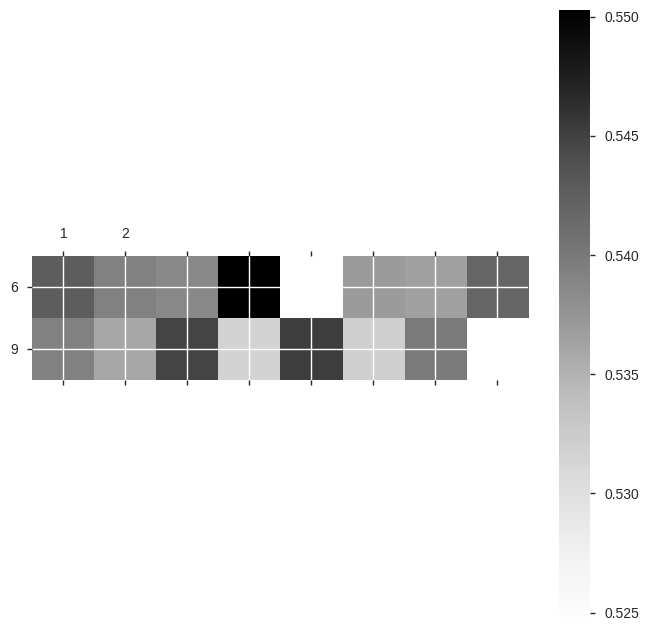

In [ ]:
hiddenLayers=range(1,3,1) 
nodes=range(6,30,3)
def plot_AUC(X_train,Y_train,X_test,Y_test):
    tr_auc_dt = np.zeros((len(hiddenLayers),len(nodes)))
    test_auc_dt = np.zeros((len(hiddenLayers),len(nodes)))
    for i,layers in enumerate(hiddenLayers):
        for j,nodes_per_layer in enumerate(nodes):
            print("layers:",layers, "nodes: ", nodes_per_layer )
            lr = MLPClassifier( alpha=1e-5, hidden_layer_sizes=(nodes_per_layer, )* layers, random_state=1, max_iter=300)
            lr.fit(X_train, Y_train)
            test_auc_dt[i][j] = roc_auc_score(Y_test, lr.predict_proba(X_test)[:, 1])
            tr_auc_dt[i][j] = roc_auc_score(Y_train, lr.predict_proba(X_train)[:, 1])
            print(test_auc_dt[i][j], tr_auc_dt[i][j])
    return tr_auc_dt, test_auc_dt

tr_auc_dt, test_auc_dt = plot_AUC(X_train, Y_train, X_test, Y_test)
# Now plot it
f, ax = plt.subplots(1, 1, figsize=(8, 8))
cax = ax.matshow(test_auc_dt, interpolation='nearest')
f.colorbar(cax)
ax.set_xticklabels(['']+list(hiddenLayers))
ax.set_yticklabels(['']+list(nodes))
plt.show()

[[0.54269999 0.53918107 0.53866617 0.5502819  0.52443455 0.53691191
  0.53650754 0.54181389]
 [0.53927478 0.53588536 0.54478089 0.53150406 0.54523679 0.53198205
  0.53996442 0.52449833]]


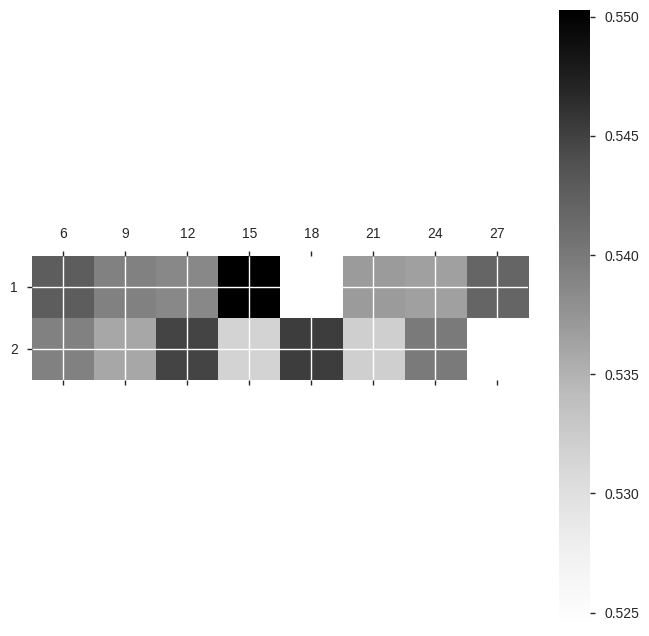

In [ ]:
f, ax = plt.subplots(1, 1, figsize=(8, 8))
cax = ax.matshow(test_auc_dt, interpolation='nearest')
f.colorbar(cax)
ax.set_yticklabels(['']+list([x for x in hiddenLayers]))
ax.set_xticklabels(['']+list([x for x in nodes]))
plt.show()
print(test_auc_dt)

Network with max AUC: nodes = 21, layers =1

In [ ]:
logit = MLPClassifier( alpha=1e-5, hidden_layer_sizes=(15), random_state=1, max_iter=300)
logit.fit(X_train, Y_train)

logit_pred = logit.predict(X_test)
# print(pd.crosstab(pd.Series(y_test, name = 'Actual'), pd.Series(logit_pred, name = 'Predict'), margins = True))

print("Accuracy is {0:.2f}".format(accuracy_score(Y_test, logit_pred)))
print("Precision is {0:.2f}".format(precision_score(Y_test, logit_pred)))
print("Recall is {0:.2f}".format(recall_score(Y_test, logit_pred)))
print("AUC score is {0:.3f}".format(roc_auc_score(Y_test, logit.predict_proba(X_test)[:, 1])))

Accuracy is 0.80
Precision is 0.11
Recall is 0.18
AUC score is 0.550


age
time_in_hospital
num_lab_procedures
num_procedures
num_medications
number_outpatient
number_emergency
number_inpatient
number_diagnoses
max_glu_serum
A1Cresult
metformin
repaglinide
nateglinide
chlorpropamide
glimepiride
acetohexamide
glipizide
glyburide
tolbutamide
pioglitazone
rosiglitazone
acarbose
miglitol
troglitazone
tolazamide
insulin
glyburide-metformin
glipizide-metformin
glimepiride-pioglitazone
metformin-rosiglitazone
metformin-pioglitazone
change
diabetesMed
health_index
severity_of_disease
number_of_changes
race_AfricanAmerican
race_Asian
race_Caucasian
race_Hispanic
race_NA
race_Other
gender_Female
gender_Male
admission_type_id_1.0
admission_type_id_3.0
admission_type_id_4.0
admission_type_id_5.0
discharge_disposition_id_1.0
discharge_disposition_id_2.0
discharge_disposition_id_7.0
discharge_disposition_id_10.0
discharge_disposition_id_18.0
discharge_disposition_id_27.0
discharge_disposition_id_28.0
admission_source_id_1.0
admission_source_id_4.0
admission_source_id_7

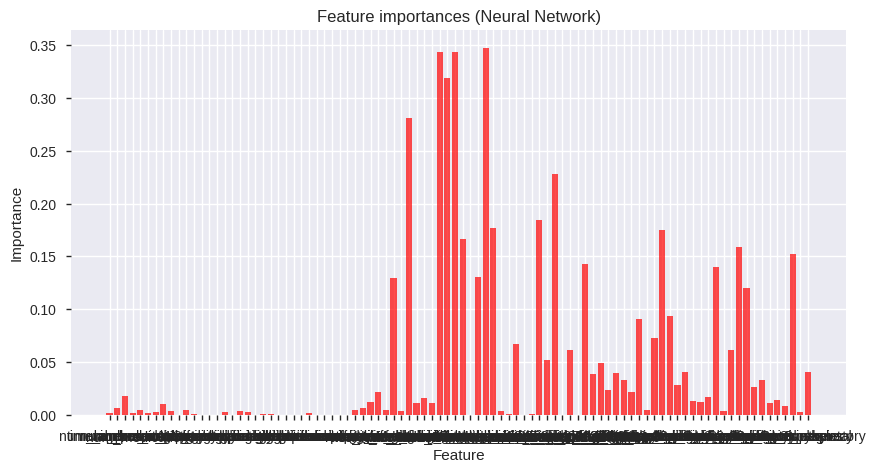

In [ ]:
def get_feature_importance(col, n):
  s = accuracy_score(Y_test, logit_pred) # baseline score
  total = 0.0
  for i in range(n):
    X_test_ = X_test.copy()
    X_test_[col] = np.random.permutation(X_test_[col])
    y_pred_ = logit.predict(X_test_)
    s_ij = accuracy_score(Y_test, y_pred_)
    total += s_ij
  return abs(s - total / n)

  # Feature importances
f = []
for col in X_test.columns:
  print(col)
  f_j = get_feature_importance(col, 100)
  f.append(f_j)
# Plot
plt.figure(figsize=(10, 5))
plt.bar([col for col in X_test.columns], f, color="r", alpha=0.7)
plt.xticks(ticks=[col for col in X_test.columns])
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Feature importances (Neural Network)")
plt.show()

age
time_in_hospital
num_lab_procedures
num_procedures
num_medications
number_outpatient
number_emergency
number_inpatient
number_diagnoses
max_glu_serum
A1Cresult
metformin
repaglinide
nateglinide
chlorpropamide
glimepiride
acetohexamide
glipizide
glyburide
tolbutamide
pioglitazone
rosiglitazone
acarbose
miglitol
troglitazone
tolazamide
insulin
glyburide-metformin
glipizide-metformin
glimepiride-pioglitazone
metformin-rosiglitazone
metformin-pioglitazone
change
diabetesMed
health_index
severity_of_disease
number_of_changes
race_AfricanAmerican
race_Asian
race_Caucasian
race_Hispanic
race_NA
race_Other
gender_Female
gender_Male
admission_type_id_1.0
admission_type_id_3.0
admission_type_id_4.0
admission_type_id_5.0
discharge_disposition_id_1.0
discharge_disposition_id_2.0
discharge_disposition_id_7.0
discharge_disposition_id_10.0
discharge_disposition_id_18.0
discharge_disposition_id_27.0
discharge_disposition_id_28.0
admission_source_id_1.0
admission_source_id_4.0
admission_source_id_7

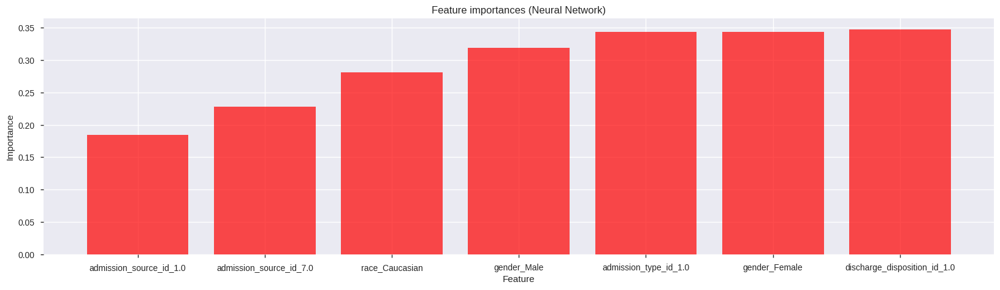

In [ ]:
g = []
for idx, col in enumerate(X_test.columns):
  print(col)
  g.append([f[idx], col])

g_sorted = list(filter(lambda x: x[0]>0.18, sorted(g, key = lambda x: x[0]) ))
print(g_sorted)

plt.figure(figsize=(20, 5))
plt.bar([col[1] for col in g_sorted], [col[0] for col in g_sorted] , color="r", alpha=0.7)
# plt.xticks(ticks=[col[1] for col in X_test.columns])
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Feature importances (Neural Network)")
plt.show()

# All Classifier Models




In [ ]:
data_scaled.head(2)

,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,health_index,severity_of_disease,race,gender,admission_type_id,discharge_disposition_id,admission_source_id,diag_1,diag_2,diag_3
0,0.000000,0.000000,0.305344,0.0,0.0000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.213904,Caucasian,Female,5.0,18.0,1.0,diabetes,diabetes,diabetes
1,0.111111,0.153846,0.442748,0.0,0.2125,0.0,0.0,0.0,0.533333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.454545,Caucasian,Female,1.0,1.0,7.0,other,diabetes,other


In [ ]:
from imblearn.over_sampling import (RandomOverSampler, 
                                    SMOTE, 
                                    ADASYN)
from collections import Counter


In [ ]:
# X_train, X_test, Y_train, Y_test = train_test_split(Final_df, Y, stratify = Y, test_size = 0.2, random_state = 24)
# print('Train Original dataset shape {}'.format(Counter(Y_train)))
# print('Test Original dataset shape {}'.format(Counter(Y_test)))

# oversample = RandomOverSampler(random_state = 12)
# # smt = SMOTE(random_state=20)

# Clf_X_train, Clf_Y_train = oversample.fit_resample(X_train, Y_train)
# print('Original dataset shape {}'.format(Counter(Clf_Y_train)))



In [ ]:
# from imblearn.over_sampling import (RandomOverSampler, 
#                                     SMOTE, 
#                                     ADASYN)
# # RandomOverSampler
#   # With over-sampling methods, the number of samples in a class
#   # should be greater or equal to the original number of samples.
# sampler = RandomOverSampler(sampling_strategy={1: 2590, 0: 300})
# X_rs, y_rs = sampler.fit_resample(X_train, y_train)
# print('RandomOverSampler {}'.format(Counter(y_rs)))
# plot_this(X_rs,y_rs, 'Random Oversampling')

# # SMOTE
# sampler = SMOTE(sampling_strategy={1: 2590, 0: 300})
# X_rs, y_rs = sampler.fit_resample(X_train, y_train)
# print('SMOTE {}'.format(Counter(y_rs)))
# plot_this(X_rs,y_rs,'SMOTE')

# # ADASYN
# sampler = ADASYN(sampling_strategy={1: 2590, 0: 300})
# X_rs, y_rs = sampler.fit_resample(X_train, y_train)
# print('ADASYN {}'.format(Counter(y_rs)))
# plot_this(X_rs,y_rs,'ADASYN')

In [ ]:
# cv

In [ ]:
from imblearn.over_sampling import ADASYN, RandomOverSampler, SMOTE
from collections import Counter


from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline

train_X_SMOTE, X_test, train_Y_SMOTE, Y_test = train_test_split(Final_df, Y, test_size=0.20, random_state=0)
print('Actual dataset {}'.format(Counter(train_Y_SMOTE)))

sm = SMOTE()
X_train, Y_train = sm.fit_resample(train_X_SMOTE , train_Y_SMOTE)
print('Sampled dataset{}'.format(Counter(Y_train)))

Clf_X_train, y_train, X_val, y_val = X_train, Y_train, X_test, Y_test

Actual dataset Counter({0: 51303, 1: 5041})
Sampled datasetCounter({1: 51303, 0: 51303})


In [ ]:
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score,f1_score
from sklearn.metrics import confusion_matrix as cm

In [ ]:
thresh = 0.5

def calc_specificity(y_actual, y_pred, thresh):
    # calculates specificity
    return sum((y_pred < thresh) & (y_actual == 0)) /sum(y_actual ==0)

def print_report(y_actual, y_pred, thresh):
    
    auc = roc_auc_score(y_actual, y_pred)
    accuracy = accuracy_score(y_actual, (y_pred > thresh))
    recall = recall_score(y_actual, (y_pred > thresh))
    precision = precision_score(y_actual, (y_pred > thresh))
    fscore = f1_score(y_actual,(y_pred > thresh) )
    specificity = calc_specificity(y_actual, y_pred, thresh)
    print('AUC:%.3f'%auc)
    print('accuracy:%.3f'%accuracy)
    print('recall:%.3f'%recall)
    print('precision:%.3f'%precision)
    print('fscore:%.3f'%fscore)
    print('specificity:%.3f'%specificity)
    print(' ')
    return auc, accuracy, recall, precision,fscore, specificity

#Gradient Boosting Classifier¶



# With sampling

In [ ]:
gradient_model = GradientBoostingClassifier(random_state=24)
gradient_model.fit(Clf_X_train, y_train)

GradientBoostingClassifier(random_state=24)

In [ ]:
y_train_preds = gradient_model.predict_proba(Clf_X_train)[:,1]
y_val_preds = gradient_model.predict_proba(X_val)[:,1]

print("Gradient Boosing")
print('Training:')
gbc_train_auc, gbc_train_accuracy, gbc_train_recall, gbc_train_precision,gbc_train_fscore, gbc_train_specificity = print_report(y_train,y_train_preds, thresh)
print('Validation:')
gbc_val_auc, gbc_val_accuracy, gbc_val_recall, gbc_val_precision, gbc_val_fscore, gbc_val_specificity = print_report(y_val,y_val_preds, thresh)

Gradient Boosing
Training:
AUC:0.959
accuracy:0.934
recall:0.868
precision:1.000
fscore:0.929
specificity:1.000
 
Validation:
AUC:0.583
accuracy:0.911
recall:0.000
precision:0.000
fscore:0.000
specificity:1.000
 


age
time_in_hospital
num_lab_procedures
num_procedures
num_medications
number_outpatient
number_emergency
number_inpatient
number_diagnoses
max_glu_serum
A1Cresult
metformin
repaglinide
nateglinide
chlorpropamide
glimepiride
acetohexamide
glipizide
glyburide
tolbutamide
pioglitazone
rosiglitazone
acarbose
miglitol
troglitazone
tolazamide
insulin
glyburide-metformin
glipizide-metformin
glimepiride-pioglitazone
metformin-rosiglitazone
metformin-pioglitazone
change
diabetesMed
health_index
severity_of_disease
number_of_changes
race_AfricanAmerican
race_Asian
race_Caucasian
race_Hispanic
race_NA
race_Other
gender_Female
gender_Male
admission_type_id_1.0
admission_type_id_3.0
admission_type_id_4.0
admission_type_id_5.0
discharge_disposition_id_1.0
discharge_disposition_id_2.0
discharge_disposition_id_7.0
discharge_disposition_id_10.0
discharge_disposition_id_18.0
discharge_disposition_id_27.0
discharge_disposition_id_28.0
admission_source_id_1.0
admission_source_id_4.0
admission_source_id_7

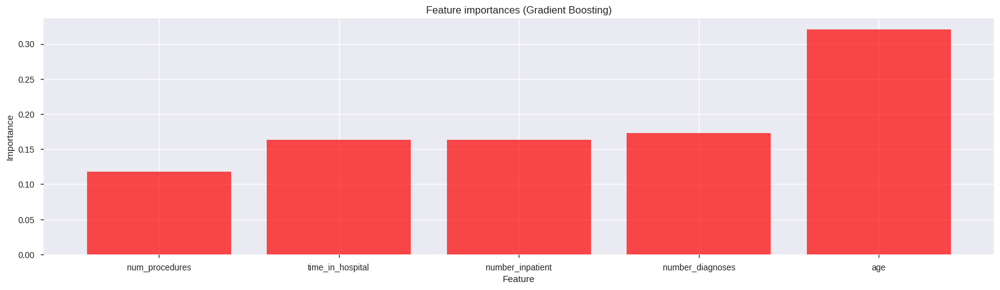

In [ ]:
g = []
f = gradient_model.feature_importances_
for idx, col in enumerate(X_test.columns):
  print(col)
  g.append([f[idx], col])

g_sorted = list(filter(lambda x: x[0]>0.05, sorted(g, key = lambda x: x[0]) ))
print(g_sorted)

plt.figure(figsize=(20, 5))
plt.bar([col[1] for col in g_sorted], [col[0] for col in g_sorted] , color="r", alpha=0.7)
# plt.xticks(ticks=[col[1] for col in X_test.columns])
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Feature importances (Gradient Boosting)")
plt.show()

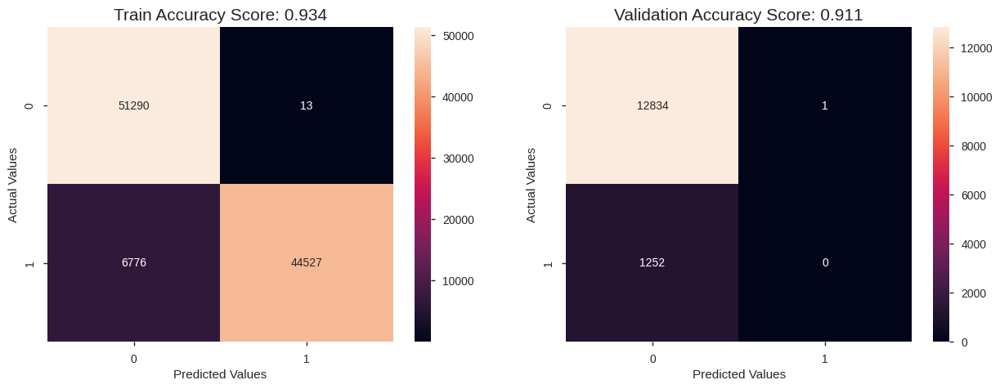

In [ ]:
# Confusion Matrix

predictions = gradient_model.predict(Clf_X_train)
train_score = round(accuracy_score(y_train, predictions), 3)
cm_train = cm(y_train, predictions)

predictions = gradient_model.predict(X_val)
val_score = round(accuracy_score(y_val, predictions), 3)
cm_val = cm(y_val, predictions)

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(15,5)) 
sns.heatmap(cm_train, annot=True, fmt=".0f",ax=ax1)
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Actual Values')
ax1.set_title('Train Accuracy Score: {0}'.format(train_score), size = 15)
sns.heatmap(cm_val, annot=True, fmt=".0f",ax=ax2)
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Actual Values')
ax2.set_title('Validation Accuracy Score: {0}'.format(val_score), size = 15)
plt.show()

#XGBOOST Classifier¶


In [ ]:
xgb_model = XGBClassifier(random_state=42)
xgb_model.fit(Clf_X_train, y_train)

XGBClassifier(random_state=42)

In [ ]:
y_train_preds = xgb_model.predict_proba(Clf_X_train)[:,1]
y_val_preds = xgb_model.predict_proba(X_val)[:,1]

print("XGBOOST")


print('Training:')
xgb_train_auc, xgb_train_accuracy, xgb_train_recall, xgb_train_precision, xgb_train_fscore, xgb_train_specificity = print_report(y_train,y_train_preds, thresh)
print('Validation:')
xgb_val_auc, xgb_val_accuracy, xgb_val_recall, xgb_val_precision,xgb_val_fscore, xgb_val_specificity = print_report(y_val,y_val_preds, thresh)

XGBOOST
Training:
AUC:0.958
accuracy:0.934
recall:0.867
precision:1.000
fscore:0.929
specificity:1.000
 
Validation:
AUC:0.581
accuracy:0.911
recall:0.000
precision:0.000
fscore:0.000
specificity:1.000
 


age
time_in_hospital
num_lab_procedures
num_procedures
num_medications
number_outpatient
number_emergency
number_inpatient
number_diagnoses
max_glu_serum
A1Cresult
metformin
repaglinide
nateglinide
chlorpropamide
glimepiride
acetohexamide
glipizide
glyburide
tolbutamide
pioglitazone
rosiglitazone
acarbose
miglitol
troglitazone
tolazamide
insulin
glyburide-metformin
glipizide-metformin
glimepiride-pioglitazone
metformin-rosiglitazone
metformin-pioglitazone
change
diabetesMed
health_index
severity_of_disease
number_of_changes
race_AfricanAmerican
race_Asian
race_Caucasian
race_Hispanic
race_NA
race_Other
gender_Female
gender_Male
admission_type_id_1.0
admission_type_id_3.0
admission_type_id_4.0
admission_type_id_5.0
discharge_disposition_id_1.0
discharge_disposition_id_2.0
discharge_disposition_id_7.0
discharge_disposition_id_10.0
discharge_disposition_id_18.0
discharge_disposition_id_27.0
discharge_disposition_id_28.0
admission_source_id_1.0
admission_source_id_4.0
admission_source_id_7

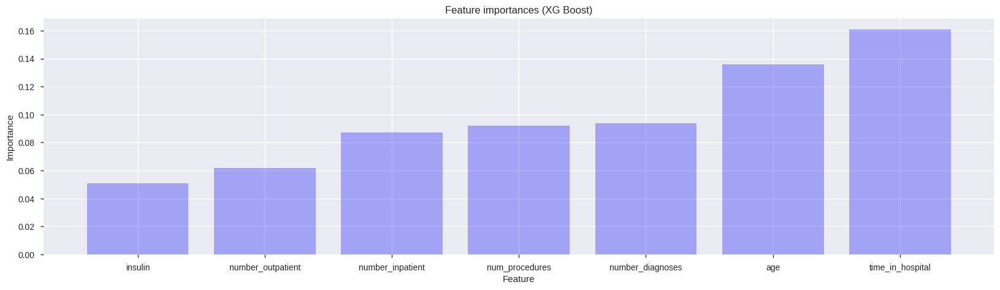

In [ ]:
g = []
f = xgb_model.feature_importances_
for idx, col in enumerate(X_test.columns):
  print(col)
  g.append([f[idx], col])

g_sorted = list(filter(lambda x: x[0]>0.05, sorted(g, key = lambda x: x[0]) ))
print(g_sorted)

plt.figure(figsize=(20, 5))
plt.bar([col[1] for col in g_sorted], [col[0] for col in g_sorted] , color="b", alpha=0.3)
# plt.xticks(ticks=[col[1] for col in X_test.columns])
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Feature importances (XG Boost)")
plt.show()

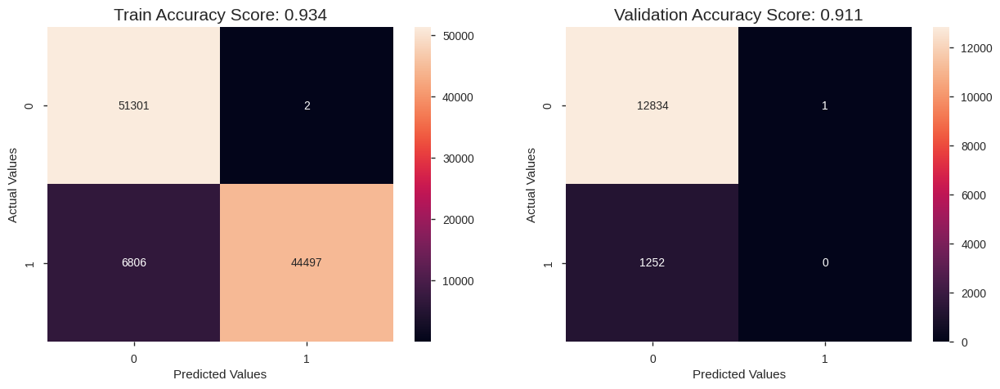

In [ ]:
# Confusion Matrix

predictions = xgb_model.predict(Clf_X_train)
train_score = round(accuracy_score(y_train, predictions), 3)
cm_train = cm(y_train, predictions)

predictions = xgb_model.predict(X_val)
val_score = round(accuracy_score(y_val, predictions), 3)
cm_val = cm(y_val, predictions)

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(15,5)) 
sns.heatmap(cm_train, annot=True, fmt=".0f",ax=ax1)
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Actual Values')
ax1.set_title('Train Accuracy Score: {0}'.format(train_score), size = 15)
sns.heatmap(cm_val, annot=True, fmt=".0f",ax=ax2)
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Actual Values')
ax2.set_title('Validation Accuracy Score: {0}'.format(val_score), size = 15)
plt.show()

#Light-GBM Classifier¶


In [ ]:
from lightgbm import LGBMClassifier
lgbm_model = LGBMClassifier(random_state = 42)
lgbm_model.fit(Clf_X_train, y_train)

LGBMClassifier(random_state=42)

In [ ]:
y_train_preds = lgbm_model.predict_proba(Clf_X_train)[:,1]
y_val_preds = lgbm_model.predict_proba(X_val)[:,1]

print("LGBM")
print('Training:')
lgbm_train_auc, lgbm_train_accuracy,lgbm_train_recall, lgbm_train_precision,lgbm_train_fscore,lgbm_train_specificity = print_report(y_train,y_train_preds, thresh)
print('Validation:')
lgbm_val_auc, lgbm_val_accuracy, lgbm_val_recall, lgbm_val_precision,lgbm_val_fscore,lgbm_val_specificity = print_report(y_val,y_val_preds, thresh)

LGBM
Training:
AUC:0.788
accuracy:0.707
recall:0.738
precision:0.695
fscore:0.716
specificity:0.676
 
Validation:
AUC:0.612
accuracy:0.646
recall:0.487
precision:0.124
fscore:0.197
specificity:0.661
 


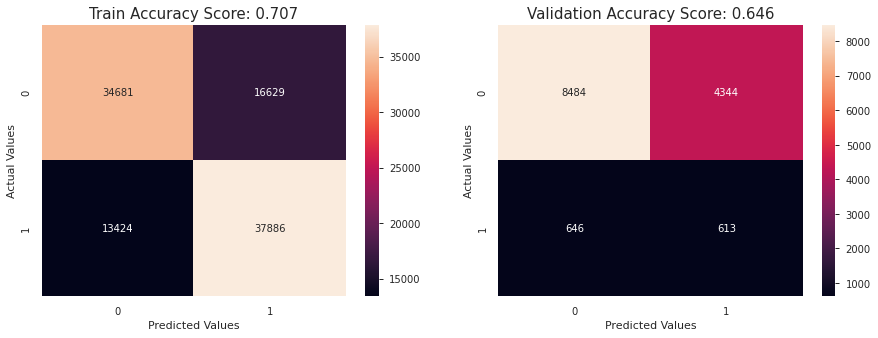

In [ ]:
# Confusion Matrix

predictions = lgbm_model.predict(Clf_X_train)
train_score = round(accuracy_score(y_train, predictions), 3)
cm_train = cm(y_train, predictions)

predictions = lgbm_model.predict(X_val)
val_score = round(accuracy_score(y_val, predictions), 3)
cm_val = cm(y_val, predictions)

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(15,5)) 
sns.heatmap(cm_train, annot=True, fmt=".0f",ax=ax1)
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Actual Values')
ax1.set_title('Train Accuracy Score: {0}'.format(train_score), size = 15)
sns.heatmap(cm_val, annot=True, fmt=".0f",ax=ax2)
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Actual Values')
ax2.set_title('Validation Accuracy Score: {0}'.format(val_score), size = 15)
plt.show()

#CATBOOST Classifier¶


In [ ]:

!pip install catboost
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier


In [ ]:
cat_model = CatBoostClassifier(random_state = 42)
cat_model.fit(Clf_X_train, y_train,verbose=False)

In [ ]:
y_train_preds = cat_model.predict_proba(Clf_X_train)[:,1]
y_val_preds = cat_model.predict_proba(X_val)[:,1]

print("CATBOOST")
print('Training:')
catb_train_auc, catb_train_accuracy,catb_train_recall, catb_train_precision,catb_train_fscore,catb_train_specificity = print_report(y_train,y_train_preds, thresh)
print('Validation:')
catb_val_auc,catb_val_accuracy, catb_val_recall, catb_val_precision,catb_val_fscore,catb_val_specificity = print_report(y_val,y_val_preds, thresh)

CATBOOST
Training:
AUC:0.924
accuracy:0.836
recall:0.855
precision:0.824
fscore:0.839
specificity:0.818
 
Validation:
AUC:0.577
accuracy:0.738
recall:0.312
precision:0.122
fscore:0.175
specificity:0.779
 


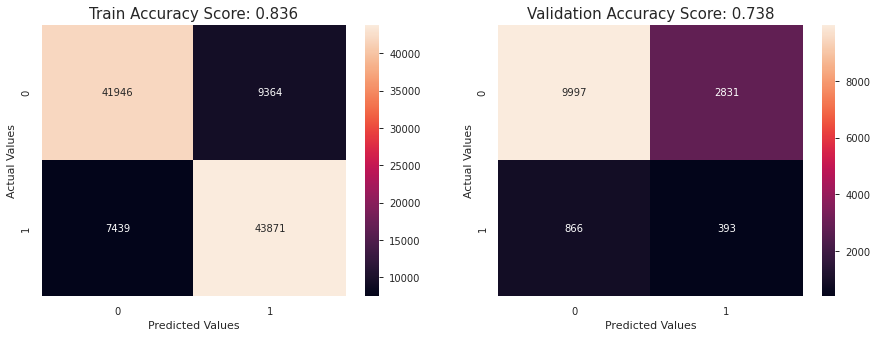

In [ ]:
# Confusion Matrix

predictions = cat_model.predict(Clf_X_train)
train_score = round(accuracy_score(y_train, predictions), 3)
cm_train = cm(y_train, predictions)

predictions = cat_model.predict(X_val)
val_score = round(accuracy_score(y_val, predictions), 3)
cm_val = cm(y_val, predictions)

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(15,5)) 
sns.heatmap(cm_train, annot=True, fmt=".0f",ax=ax1)
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Actual Values')
ax1.set_title('Train Accuracy Score: {0}'.format(train_score), size = 15)
sns.heatmap(cm_val, annot=True, fmt=".0f",ax=ax2)
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Actual Values')
ax2.set_title('Validation Accuracy Score: {0}'.format(val_score), size = 15)
plt.show()

# DecisionTreeClassifier

In [ ]:
Final_df = pd.get_dummies(data_scaled, columns=cat_cols).copy()
Y = data['readmitted']
x_train, x_test_dt, y_train, y_test_dt = train_test_split(Final_df, Y, stratify = Y, test_size = 0.1, random_state = 24)


In [ ]:
data_train_x, data_val_x, data_train_y, data_val_y = train_test_split(x_train, y_train, random_state = 24, \
                                                                      test_size = 0.1, stratify = y_train)
oversample = RandomOverSampler(random_state = 12)
data_trainn_x, data_trainn_y = oversample.fit_resample(data_train_x, data_train_y)
data_trainn_x = pd.DataFrame(data_trainn_x)
data_trainn_x.columns = data_val_x.columns

In [ ]:
dt = DecisionTreeClassifier(max_features = 'sqrt', class_weight = "balanced", random_state = 34, splitter = 'best')

dt_params = {"max_depth": range(1, 100, 1),
              "min_samples_split" : range(2, 20, 1)}
dt_cv_model = GridSearchCV(dt, dt_params, cv=2, n_jobs=-1, scoring = 'average_precision', verbose=2).fit(data_trainn_x, data_trainn_y)
dt_cv_model.best_score_

Fitting 2 folds for each of 1782 candidates, totalling 3564 fits


0.8648921460613868

In [ ]:
dt_cv_model.best_params_


{'max_depth': 38, 'min_samples_split': 2}

In [ ]:
dt_model = dt_cv_model.best_estimator_
#rf_model.fit(data_trainn_x, data_trainn_y)
predicted_prob = dt_model.predict_proba(x_test_dt)[:, 1]
predicted = dt_model.predict(x_test_dt)
AUC_DT = roc_auc_score(y_test_dt, predicted_prob)
print('AUC_DT = ', AUC_DT)
f1_pos = f1_score(y_test_dt, predicted)
f1_neg = f1_score([0 if x == 1 else 1 for x in y_test_dt], [0 if x == 1 else 1 for x in predicted])
print('F1_POS = ', f1_pos, 'F1_NEG = ', f1_neg)
HARMONIC_F1_DT = ((2 * f1_pos * f1_neg) / (f1_neg + f1_pos))
print('Harmonic_F1_DT =', HARMONIC_F1_DT)

AUC_DT =  0.5184648955957012
F1_POS =  0.1282565130260521 F1_NEG =  0.8963545389563975
Harmonic_F1_DT = 0.2244038015775596


In [ ]:
y_train_preds = dt_model.predict_proba(data_train_x)[:,1]
y_val_preds = dt_model.predict_proba(data_val_x)[:,1]
y_test_preds = dt_model.predict_proba(x_test_dt)[:,1]

print("DT")
print('Training:')
print_report(data_train_y,y_train_preds, thresh)
print('Validation:')
print_report(data_val_y,y_val_preds, thresh)
print('Testing:')
print_report(y_test_dt,y_test_preds, thresh)

DT
Training:
AUC:0.998
accuracy:0.963
recall:0.990
precision:0.710
fscore:0.827
specificity:0.960
 
Validation:
AUC:0.512
accuracy:0.816
recall:0.136
precision:0.102
fscore:0.116
specificity:0.881
 
Testing:
AUC:0.518
accuracy:0.815
recall:0.153
precision:0.111
fscore:0.128
specificity:0.880
 


(0.5184648955957012,
 0.8147359454855196,
 0.15262321144674085,
 0.11059907834101383,
 0.1282565130260521,
 0.8796570537802026)

# Random Forest Classifier¶


In [ ]:
Final_df.head(3)

,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,health_index,severity_of_disease,number_of_changes,race_AfricanAmerican,race_Asian,race_Caucasian,...,discharge_disposition_id_10.0,discharge_disposition_id_18.0,discharge_disposition_id_27.0,discharge_disposition_id_28.0,admission_source_id_1.0,admission_source_id_4.0,admission_source_id_7.0,admission_source_id_8.0,admission_source_id_9.0,admission_source_id_11.0,diag_1_circulatory,diag_1_diabetes,diag_1_digestive,diag_1_genitourinary,diag_1_injury,diag_1_musculoskeletal,diag_1_neoplasms,diag_1_other,diag_1_pregnecy,diag_1_respiratory,diag_2_circulatory,diag_2_diabetes,diag_2_digestive,diag_2_genitourinary,diag_2_injury,diag_2_musculoskeletal,diag_2_neoplasms,diag_2_other,diag_2_pregnecy,diag_2_respiratory,diag_3_circulatory,diag_3_diabetes,diag_3_digestive,diag_3_genitourinary,diag_3_injury,diag_3_musculoskeletal,diag_3_neoplasms,diag_3_other,diag_3_pregnecy,diag_3_respiratory
0,0.000000,0.000000,0.305344,0.000000,0.0000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.213904,0.00,0,0,1,...,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1,0.111111,0.153846,0.442748,0.000000,0.2125,0.000000,0.0,0.000000,0.533333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.000000,0.454545,0.25,0,0,1,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,0.222222,0.076923,0.076336,0.833333,0.1500,0.047619,0.0,0.083333,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.666667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.319444,0.176471,0.00,1,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [ ]:
Final_df = pd.get_dummies(data_scaled, columns=cat_cols).copy()
Y = data['readmitted']
x_train, x_test_rf, y_train, y_test_rf = train_test_split(Final_df, Y, stratify = Y, test_size = 0.1, random_state = 24)


In [ ]:
data_train_x, data_val_x, data_train_y, data_val_y = train_test_split(x_train, y_train, random_state = 24, \
                                                                      test_size = 0.1, stratify = y_train)
oversample = RandomOverSampler(random_state = 12)
data_trainn_x, data_trainn_y = oversample.fit_resample(data_train_x, data_train_y)
data_trainn_x = pd.DataFrame(data_trainn_x)
data_trainn_x.columns = data_val_x.columns

In [ ]:
rf = RandomForestClassifier(max_features = 'sqrt', max_samples = 0.8, class_weight = "balanced")

rf_params = {"max_depth": [5, 10, 20, 25, 30],
             "n_estimators": range(100, 210, 30)}

rf_cv_model = GridSearchCV(rf, rf_params, cv=2, n_jobs=-1, scoring = 'roc_auc', verbose=2).fit(data_trainn_x, data_trainn_y)
print(rf_cv_model.best_score_)
print(rf_cv_model.best_params_)

Fitting 2 folds for each of 20 candidates, totalling 40 fits
0.9983918497185325
{'max_depth': 30, 'n_estimators': 130}


In [ ]:
rf_model = rf_cv_model.best_estimator_
#rf_model.fit(data_trainn_x, data_trainn_y)
predicted_prob = rf_model.predict_proba(x_test_rf)[:, 1]
predicted = rf_model.predict(x_test_rf)
AUC_RF = roc_auc_score(y_test_rf, predicted_prob)
print('AUC_RF = ', AUC_RF)
f1_pos = f1_score(y_test_rf, predicted)
f1_neg = f1_score([0 if x == 1 else 1 for x in y_test_rf], [0 if x == 1 else 1 for x in predicted])
print('F1_POS = ', f1_pos, 'F1_NEG = ', f1_neg)
HARMONIC_F1_RF = ((2 * f1_pos * f1_neg) / (f1_neg + f1_pos))
print('Harmonic_F1_RF =', HARMONIC_F1_RF)

AUC_RF =  0.5829593795345023
F1_POS =  0.023633677991137372 F1_NEG =  0.950712102005816
Harmonic_F1_RF = 0.04612084157875258


In [ ]:
y_train_preds = rf_model.predict_proba(data_train_x)[:,1]
y_val_preds = rf_model.predict_proba(data_val_x)[:,1]
y_test_preds = rf_model.predict_proba(x_test_rf)[:,1]

print("RF")
print('Training:')
print_report(data_train_y,y_train_preds, thresh)
print('Validation:')
print_report(data_val_y,y_val_preds, thresh)
print('Testing:')
print_report(y_test_rf,y_test_preds, thresh)

RF
Training:
AUC:1.000
accuracy:0.999
recall:1.000
precision:0.987
fscore:0.994
specificity:0.999
 
Validation:
AUC:0.543
accuracy:0.906
recall:0.004
precision:0.054
fscore:0.007
specificity:0.994
 
Testing:
AUC:0.583
accuracy:0.906
recall:0.013
precision:0.167
fscore:0.024
specificity:0.994
 


(0.5829593795345023,
 0.9061612720045429,
 0.012718600953895072,
 0.16666666666666666,
 0.023633677991137372,
 0.9937646141855028)

age
time_in_hospital
num_lab_procedures
num_procedures
num_medications
number_outpatient
number_emergency
number_inpatient
number_diagnoses
max_glu_serum
A1Cresult
metformin
repaglinide
nateglinide
chlorpropamide
glimepiride
acetohexamide
glipizide
glyburide
tolbutamide
pioglitazone
rosiglitazone
acarbose
miglitol
troglitazone
tolazamide
insulin
glyburide-metformin
glipizide-metformin
glimepiride-pioglitazone
metformin-rosiglitazone
metformin-pioglitazone
change
diabetesMed
health_index
severity_of_disease
number_of_changes
race_AfricanAmerican
race_Asian
race_Caucasian
race_Hispanic
race_NA
race_Other
gender_Female
gender_Male
admission_type_id_1.0
admission_type_id_3.0
admission_type_id_4.0
admission_type_id_5.0
discharge_disposition_id_1.0
discharge_disposition_id_2.0
discharge_disposition_id_7.0
discharge_disposition_id_10.0
discharge_disposition_id_18.0
discharge_disposition_id_27.0
discharge_disposition_id_28.0
admission_source_id_1.0
admission_source_id_4.0
admission_source_id_7

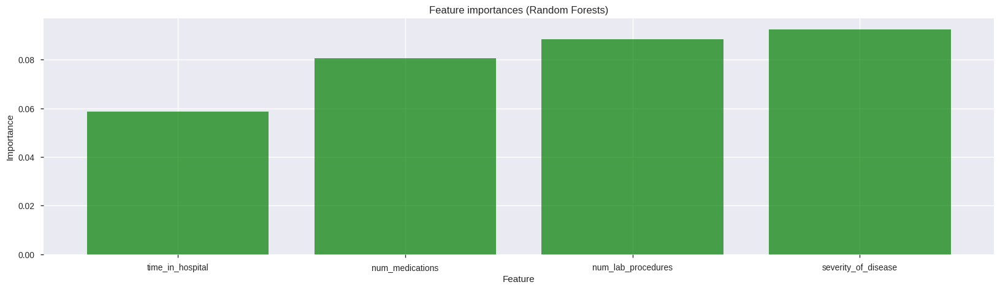

In [ ]:
g = []
f = rf_model.feature_importances_
for idx, col in enumerate(X_test.columns):
  print(col)
  g.append([f[idx], col])

g_sorted = list(filter(lambda x: x[0]>0.05, sorted(g, key = lambda x: x[0]) ))
print(g_sorted)

plt.figure(figsize=(20, 5))
plt.bar([col[1] for col in g_sorted], [col[0] for col in g_sorted] , color="green", alpha=0.7)
# plt.xticks(ticks=[col[1] for col in X_test.columns])
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Feature importances (Random Forests)")
plt.show()

In [ ]:
# !pip install sklearn-evaluation


In [ ]:
from sklearn_evaluation import plot


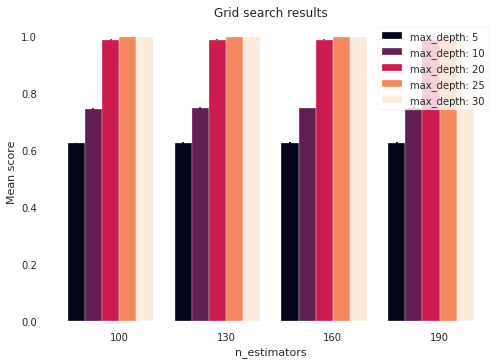

In [ ]:
plot.grid_search(rf_cv_model.cv_results_, change='n_estimators', kind='bar')

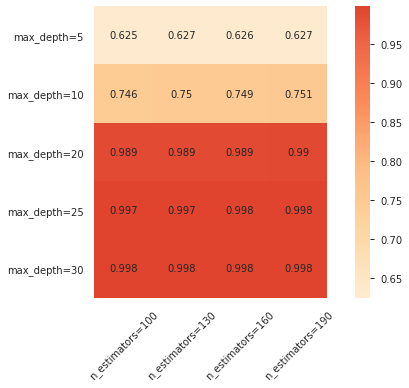

In [ ]:
plot.grid_search(rf_cv_model.cv_results_, change=('n_estimators', 'max_depth'))
        


In [ ]:
df mean_test_score param_max_depth param_n_estimators

In [ ]:
random_forest_model = RandomForestClassifier(random_state=42, n_estimators=100, max_depth=25)
random_forest_model.fit(Clf_X_train, y_train) 


RandomForestClassifier(max_depth=25, random_state=42)

In [ ]:
y_train_preds = random_forest_model.predict_proba(Clf_X_train)[:,1]
y_val_preds = random_forest_model.predict_proba(X_val)[:,1]

print("Random Forest")
print('Training:')
rf_train_auc, rf_train_accuracy, rf_train_recall, rf_train_precision,rf_train_fscore, rf_train_specificity =print_report(y_train,y_train_preds, thresh)
print('Validation:')
rf_val_auc, rf_val_accuracy, rf_val_recall, rf_val_precision,rf_val_fscore, rf_val_specificity = print_report(y_val,y_val_preds, thresh)

Random Forest
Training:
AUC:1.000
accuracy:0.996
recall:0.998
precision:0.994
fscore:0.996
specificity:0.994
 
Validation:
AUC:0.565
accuracy:0.901
recall:0.017
precision:0.124
fscore:0.031
specificity:0.988
 


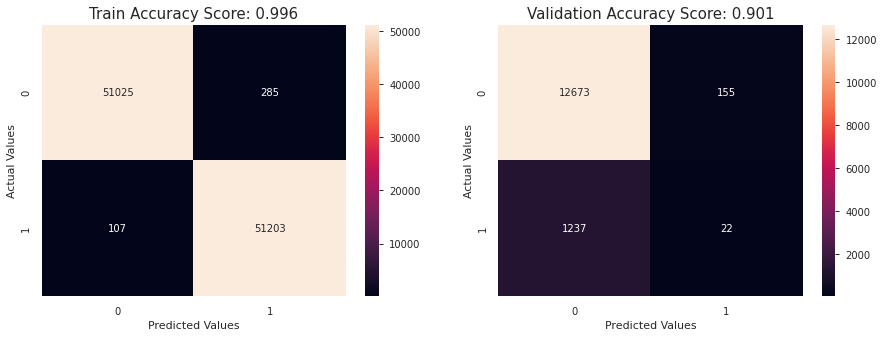

In [ ]:
# Confusion Matrix

predictions = random_forest_model.predict(Clf_X_train)
train_score = round(accuracy_score(y_train, predictions), 3)
cm_train = cm(y_train, predictions)

predictions = random_forest_model.predict(X_val)
val_score = round(accuracy_score(y_val, predictions), 3)
cm_val = cm(y_val, predictions)

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(15,5)) 
sns.heatmap(cm_train, annot=True, fmt=".0f",ax=ax1)
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Actual Values')
ax1.set_title('Train Accuracy Score: {0}'.format(train_score), size = 15)
sns.heatmap(cm_val, annot=True, fmt=".0f",ax=ax2)
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Actual Values')
ax2.set_title('Validation Accuracy Score: {0}'.format(val_score), size = 15)
plt.show()

In [ ]:
data["race"].value_counts()

Caucasian          76099
AfricanAmerican    19210
NA                  2273
Hispanic            2037
Other               1506
Asian                641
Name: race, dtype: int64

In [ ]:
data["race"][data["readmitted"] ==1].value_counts()

Caucasian          8592
AfricanAmerican    2155
Hispanic            212
NA                  188
Other               145
Asian                65
Name: race, dtype: int64

In [ ]:
x = ["Asian", "Caucasian", "AfricanAmerican", "Hispanic", "NA"]
y1 = [65, 8592, 2155, 212, 188]
y2 = [65/641 * 100, 8592/76099 * 100, 2155/19210 * 100, 212/2037 * 100, 188/2273 * 100]

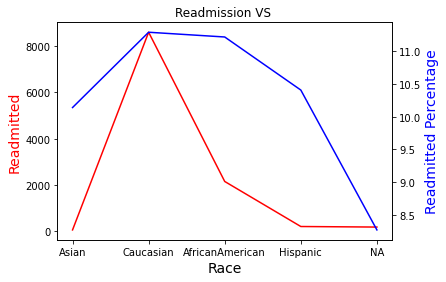

In [ ]:
# create figure and axis objects with subplots()
fig,ax = plt.subplots()
# make a plot
ax.plot(x, y1, color="red")
# set x-axis label
ax.set_xlabel("Race",fontsize=14)
ax.set_ylabel("Readmitted",color="red",fontsize=14)
ax2=ax.twinx()
# make a plot with different y-axis using second axis object
ax2.plot(x,y2,color="blue")
ax2.set_ylabel("Readmitted Percentage",color="blue",fontsize=14)
plt.title("Readmission VS ")
plt.show()
# # save the plot as a file
fig.savefig('race_readmission.jpg',
            format='jpeg',
            dpi=100,
            bbox_inches='tight')

In [ ]:
X = np.array([[2,3,4], [1,3,5]])

In [ ]:
y = np.random.permutation(range(X.shape[0]))

In [ ]:
X

array([[2, 3, 4],
       [1, 3, 5]])

In [ ]:
y

array([1, 0])

In [ ]:
X[y, 2]

array([5, 4])

In [ ]:
X_test_.num_lab_procedures.count()

14087

In [ ]:
X_test_["num_lab_procedures"]

52473         NaN
34135         NaN
26250         NaN
45093         NaN
55843         NaN
           ...   
53939         NaN
15437         NaN
34981         NaN
41356         NaN
3706     0.503817
Name: num_lab_procedures, Length: 14087, dtype: float64